In [1]:
%matplotlib inline

# 1) Wipe out your namespace
%reset -f

# 2) Clear Jupyter’s stored outputs (and inputs if you like)
try:
    Out.clear() 
except NameError:
    pass

try:
    In.clear()
except NameError:
    pass

# 3) Force Python GC
import gc
gc.collect()

# 4) Free any GPU buffers
import torch
if torch.cuda.is_available():
    torch.cuda.empty_cache()

# 5) remove checkpoints
# import os; _ = [os.remove(p) for p in __import__("glob").glob("libs/.ipynb_checkpoints/*.py") if os.path.exists(p)]


import importlib
from libs import trades, plots, params, feats, strategies
importlib.reload(trades)
importlib.reload(plots)
importlib.reload(params)
importlib.reload(feats)
importlib.reload(strategies)

<module 'libs.strategies' from '/workspace/my_models/Trading/_Stock_Analysis_/libs/strategies.py'>

In [2]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
import seaborn as sns

import glob
import json
import re
import os
import psutil

import time
import datetime as dt
from tqdm.auto import tqdm
from IPython.display import clear_output, display

,open,high,low,close,volume,signal,ret,log_ret,sma_9,sma_21,sma_pct_9,sma_pct_21,ema_9,ema_21,roc_9,roc_21,body,body_pct,upper_shad,lower_shad,range_pct,rsi_6,macd_line,macd_signal,macd_diff,atr_14,atr_pct_14,bb_lband_20,bb_hband_20,bb_w_20,plus_di,minus_di,adx,obv,vwap_14,vwap_dev_pct_14,vol_spike,vol_z_14,rolling_max_close_21,rolling_min_close_21,dist_high_21,dist_low_21,obv_sma,obv_diff_14,obv_pct_14,obv_sma_14,obv_z_14,ret_30,sma_30,sma_pct_30,ema_30,roc_30,rsi_30,atr_30,atr_pct_30,bb_lband_30,bb_hband_30,bb_w_30,plus_di_30,minus_di_30,adx_30,obv_diff_30,obv_pct_30,obv_sma_30,obv_z_30,vwap_30,vwap_dev_pct_30,z_vwap_dev_30,vol_spike_30,vol_z_30,ret_std_30,rolling_max_close_30,rolling_min_close_30,dist_high_30,dist_low_30,macd_line_30,macd_signal_30,macd_diff_30,ret_45,sma_45,sma_pct_45,ema_45,roc_45,rsi_45,atr_45,atr_pct_45,bb_lband_45,bb_hband_45,bb_w_45,plus_di_45,minus_di_45,adx_45,obv_diff_45,obv_pct_45,obv_sma_45,obv_z_45,vwap_45,vwap_dev_pct_45,z_vwap_dev_45,vol_spike_45,vol_z_45,ret_std_45,rolling_max_close_45,rolling_min_close_45,dist_high_45,dist_low_45,macd_line_45,macd_signal_45,macd_diff_45,ret_60,sma_60,sma_pct_60,ema_60,roc_60,rsi_60,atr_60,atr_pct_60,bb_lband_60,bb_hband_60,bb_w_60,plus_di_60,minus_di_60,adx_60,obv_diff_60,obv_pct_60,obv_sma_60,obv_z_60,vwap_60,vwap_dev_pct_60,z_vwap_dev_60,vol_spike_60,vol_z_60,ret_std_60,rolling_max_close_60,rolling_min_close_60,dist_high_60,dist_low_60,macd_line_60,macd_signal_60,macd_diff_60,volume_z_30,vol_spike_z_30,ret_std_z_30,obv_pct_z_30,vwap_dev_pct_z_30,bb_w_z_30,atr_z_30,macd_diff_z_30,volume_z_45,vol_spike_z_45,ret_std_z_45,obv_pct_z_45,vwap_dev_pct_z_45,bb_w_z_45,atr_z_45,macd_diff_z_45,volume_z_60,vol_spike_z_60,ret_std_z_60,obv_pct_z_60,vwap_dev_pct_z_60,bb_w_z_60,atr_z_60,macd_diff_z_60,minute_time,hour_time,dow_time,month_time,day_of_year_time,week_of_year_time,in_sess_time,eng_ma,eng_macd,eng_bb,eng_bb_mid,eng_rsi,eng_adx,eng_obv,eng_atr_div,z_eng_atr,eng_sma_short,eng_sma_long,eng_vwap,z_vwap_dev,z_bb_w,z_obv,mom_sum_30,mom_std_30,mom_sum_45,mom_std_45,mom_sum_60,mom_std_60,eng_ema_cross_up,eng_ema_cross_down,ask,bid,rsi_min_thresh,rsi_max_thresh
2023-06-20 10:58:00,184.231176,184.231176,184.231176,184.231176,3.234118e+02,0.051382,0.000013,0.000013,184.221765,184.217899,0.000051,0.000072,184.222993,184.213473,0.000115,0.000115,0.000,0.000000,0.0000,0.000,0.000000,76.041149,0.011741,0.012284,-0.000543,0.010519,0.000057,184.194746,184.244843,0.000272,43.794144,28.957936,14.634069,-1.793694e+04,184.153558,0.042149,0.452882,-0.633136,184.250000,184.18,0.000102,0.000278,-2.037458e+04,2.310459e+03,12.542109,-2.037458e+04,3.908094,0.000549,184.202196,0.000157,184.205376,0.000549,55.171376,0.019179,0.000104,184.141673,184.262719,0.000657,38.103454,33.547114,9.496865,4.339559e+03,23.558670,-1.960413e+04,0.473522,184.203633,0.014953,0.298750,0.520916,-0.623151,0.000061,184.25,184.130000,0.000102,0.000549,0.014354,0.016401,-0.002046,0.000658,184.196020,0.000191,184.194402,0.000658,52.417785,0.025601,0.000139,184.120200,184.271839,0.000823,33.595170,36.049297,13.959975,6.732259e+03,36.549426,-2.080045e+04,0.735183,184.197152,0.018472,-0.796330,0.489536,-0.684275,0.000141,184.25,184.13,0.000102,0.000549,0.016463,0.015345,0.001118,0.000767,184.173765,0.000312,184.190049,0.000767,50.816510,0.030283,0.000164,184.069825,184.277705,0.001129,31.159455,37.519026,0.000000,2.835559e+03,15.396106,-2.135122e+04,0.686001,184.177444,0.029174,-0.269215,0.512504,-0.715955,0.000130,184.25,184.07,0.000102,0.000875,0.012130,0.009181,0.002949,-0.259331,-1.317039e-07,-20.000000,0.141932,0.376057,-0.681241,-1.077179,-20.000000,-0.551193,-3.252887e-07,-20.000000,20.000000,-20.000000,-20.000000,-0.902682,0.000000,-0.720662,-1.698568e-12,0.000000,0.000000,-20.000000,-20.000000,-0.469189,0.000000,0.352778,0.312500,0.642857,0.916667,0.965753,0.961538,0.0,0.000021,-2.946630e-06,0.000000,-0.000062,0.060411,0.000000,-0.113243,-0.116486,-1.302803,-0.000051,-0.000072,-99.977122,1.388855,-1.309569,1

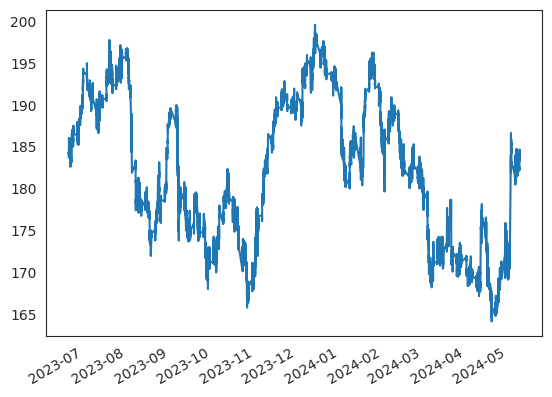

In [3]:
# Read the unscaled indicators dataframe (only the test part)

df_inds_test = pd.read_csv(params.indunsc_test_csv, index_col=0, parse_dates=True) # indunsc_test_csv
df_inds_test = df_inds_test[(df_inds_test.index >= '2023-06-20') & (df_inds_test.index < '2024-05-10')] #########################

# compute synthetic ask/bid from close_raw and configured spread
df_inds_test['ask'] = df_inds_test['close'] * (1 + params.bidask_spread_pct/100)
df_inds_test['bid'] = df_inds_test['close'] * (1 - params.bidask_spread_pct/100)
df_inds_test['rsi_min_thresh'] = params.rsi_min_thresh_tick
df_inds_test['rsi_max_thresh'] = params.rsi_max_thresh_tick

df_inds_test.close.plot()
df_inds_test

In [4]:
# importlib.reload(params) #####
# importlib.reload(strategies) #####

first_day = df_inds_test.index.normalize().min()
start_ask = df_inds_test.loc[df_inds_test.index.normalize() == first_day, "ask"].iloc[0]
strategies.reset_globals(start_ask)  # reset globals and initialize buy&hold with canonical first-day ask

# df_inds_test = df_inds_test[df_inds_test.index.to_period("M") == params.month_to_check] ################################

sim_results = {}
groups = df_inds_test.groupby(df_inds_test.index.normalize())
total_days = df_inds_test.index.normalize().nunique()
col_signal = params.col_signal_tick
sign_thresh = params.sign_thresh_tick
sess_start = params.sess_start_tick

for day, df_day_sim in tqdm(groups, desc="Generate+Simulate", total=total_days):
    
    df_actions = strategies.generate_actions_slope(
        df              = df_day_sim,
        col_signal      = col_signal,
        sign_thresh     = sign_thresh,
        col_atr         = "atr_14",
        col_rsi         = "rsi_6",
        col_vwap        = "vwap_14",
        reset_peak      = params.reset_peak_tick,
        rsi_min_thresh  = params.rsi_min_thresh_tick,
        rsi_max_thresh  = params.rsi_max_thresh_tick,
        trailstop_pct   = params.trailstop_pct_tick,
        atr_mult        = params.atr_mult_tick,
        vwap_atr_mult   = params.vwap_atr_mult_tick,
        sess_start      = sess_start
    )
    
    sim_results.update(
        strategies.simulate_trading(
            day         = day,
            df          = df_actions,
            invest_frac = params.invest_frac_tick,
            buy_factor  = params.buy_factor_tick,
            sell_factor = params.sell_factor_tick,
            sess_start  = sess_start
        )
    )

print("Loop finished. Days simulated:", len(sim_results))


Generate+Simulate:   0%|          | 0/225 [00:00<?, ?it/s]

Loop finished. Days simulated: 225


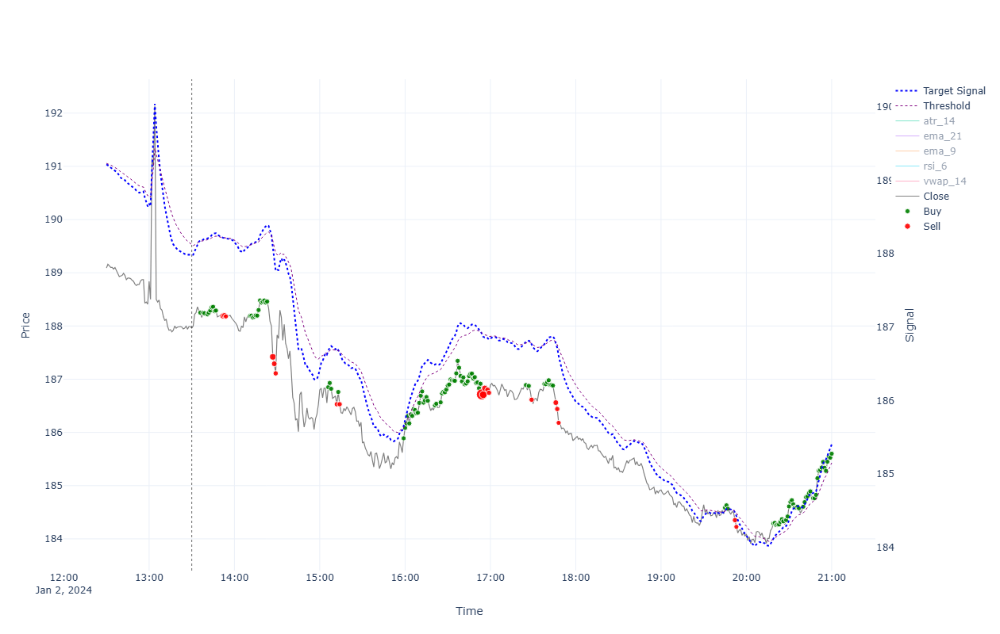


                                                  ******* Performance for 2024-01-02 *******

INTRADAY:
  shares(562); [ask_buy=187.998, fee_buy=0.004, pos_amnt_buy=105656.895]; [bid_sell=185.563, fee_sell=0.018, pos_amnt_sell=104276.077]; leftover=58.137; PNL=-1380.817
TRADES:
  Tr[1]: Time(13:36)Ask(188.288)Bid(188.212)Act(Buy)Shrs(1)Pos(1); CashTr(-188.292)=Cost(-188.288)-Fee(-0.004); P&L(96909.314)=CashTot(96721.102)+PosAmt(188.212)
  Tr[2]: Time(13:38)Ask(188.288)Bid(188.212)Act(Buy)Shrs(1)Pos(2); CashTr(-188.292)=Cost(-188.288)-Fee(-0.004); P&L(96909.235)=CashTot(96532.81)+PosAmt(376.425)
  Tr[3]: Time(13:39)Ask(188.278)Bid(188.202)Act(Buy)Shrs(1)Pos(3); CashTr(-188.282)=Cost(-188.278)-Fee(-0.004); P&L(96909.135)=CashTot(96344.528)+PosAmt(564.607)
  Tr[4]: Time(13:41)Ask(188.258)Bid(188.182)Act(Buy)Shrs(1)Pos(4); CashTr(-188.262)=Cost(-188.258)-Fee(-0.004); P&L(96908.996)=CashTot(96156.267)+PosAmt(752.729)
  Tr[5]: Time(13:42)Ask(188.288)Bid(188.212)Act(Buy)Shrs(1)Pos(5); CashTr

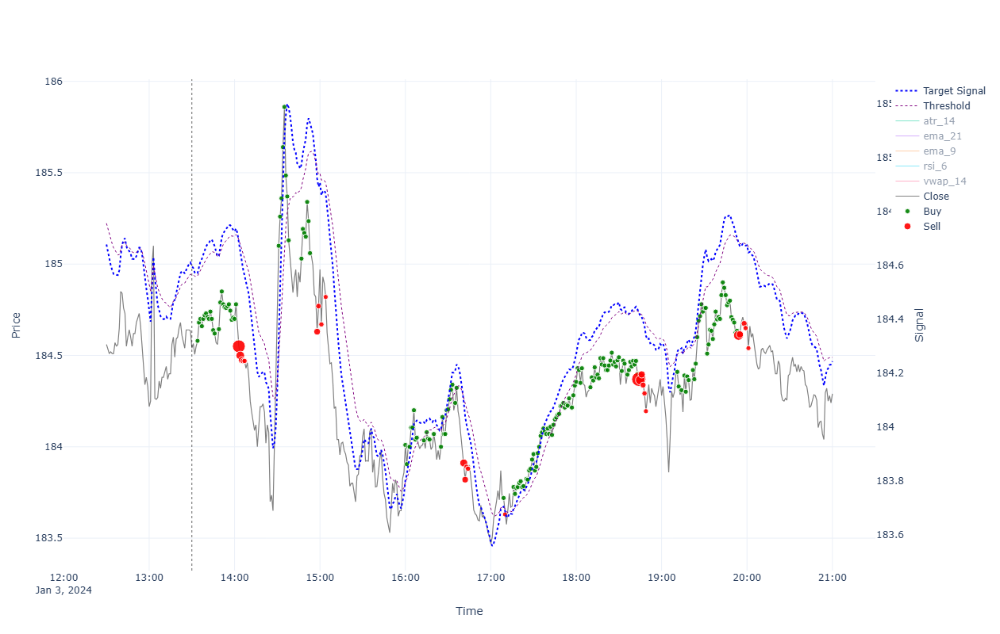


                                                  ******* Performance for 2024-01-03 *******

INTRADAY:
  shares(565); [ask_buy=184.577, fee_buy=0.004, pos_amnt_buy=104288.213]; [bid_sell=184.253, fee_sell=0.018, pos_amnt_sell=104092.726]; leftover=46.001; PNL=-195.487
TRADES:
  Tr[1]: Time(13:34)Ask(184.617)Bid(184.543)Act(Buy)Shrs(1)Pos(39); CashTr(-184.621)=Cost(-184.617)-Fee(-0.004); P&L(96869.826)=CashTot(89672.646)+PosAmt(7197.18)
  Tr[2]: Time(13:35)Ask(184.717)Bid(184.643)Act(Buy)Shrs(1)Pos(40); CashTr(-184.721)=Cost(-184.717)-Fee(-0.004); P&L(96873.647)=CashTot(89487.925)+PosAmt(7385.723)
  Tr[3]: Time(13:36)Ask(184.737)Bid(184.663)Act(Buy)Shrs(1)Pos(41); CashTr(-184.741)=Cost(-184.737)-Fee(-0.004); P&L(96874.369)=CashTot(89303.184)+PosAmt(7571.185)
  Tr[4]: Time(13:37)Ask(184.697)Bid(184.623)Act(Buy)Shrs(1)Pos(42); CashTr(-184.701)=Cost(-184.697)-Fee(-0.004); P&L(96872.652)=CashTot(89118.483)+PosAmt(7754.169)
  Tr[5]: Time(13:38)Ask(184.737)Bid(184.663)Act(Buy)Shrs(1)Pos(43)

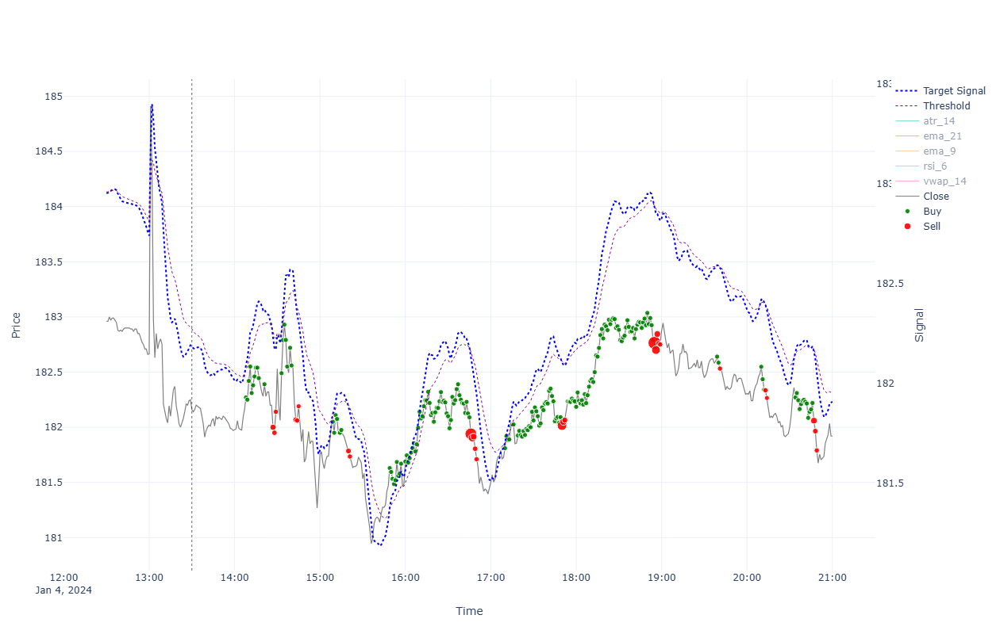


                                                  ******* Performance for 2024-01-04 *******

INTRADAY:
  shares(571); [ask_buy=182.196, fee_buy=0.004, pos_amnt_buy=104036.447]; [bid_sell=181.884, fee_sell=0.018, pos_amnt_sell=103845.167]; leftover=102.28; PNL=-191.279
TRADES:
  Tr[1]: Time(14:08)Ask(182.306)Bid(182.234)Act(Buy)Shrs(1)Pos(1); CashTr(-182.31)=Cost(-182.306)-Fee(-0.004); P&L(96840.478)=CashTot(96658.245)+PosAmt(182.234)
  Tr[2]: Time(14:09)Ask(182.286)Bid(182.214)Act(Buy)Shrs(1)Pos(2); CashTr(-182.29)=Cost(-182.286)-Fee(-0.004); P&L(96840.381)=CashTot(96475.954)+PosAmt(364.427)
  Tr[3]: Time(14:10)Ask(182.456)Bid(182.384)Act(Buy)Shrs(1)Pos(3); CashTr(-182.46)=Cost(-182.456)-Fee(-0.004); P&L(96840.644)=CashTot(96293.494)+PosAmt(547.151)
  Tr[4]: Time(14:11)Ask(182.587)Bid(182.513)Act(Buy)Shrs(1)Pos(4); CashTr(-182.591)=Cost(-182.587)-Fee(-0.004); P&L(96840.957)=CashTot(96110.903)+PosAmt(730.054)
  Tr[5]: Time(14:12)Ask(182.346)Bid(182.274)Act(Buy)Shrs(1)Pos(5); CashTr(-1

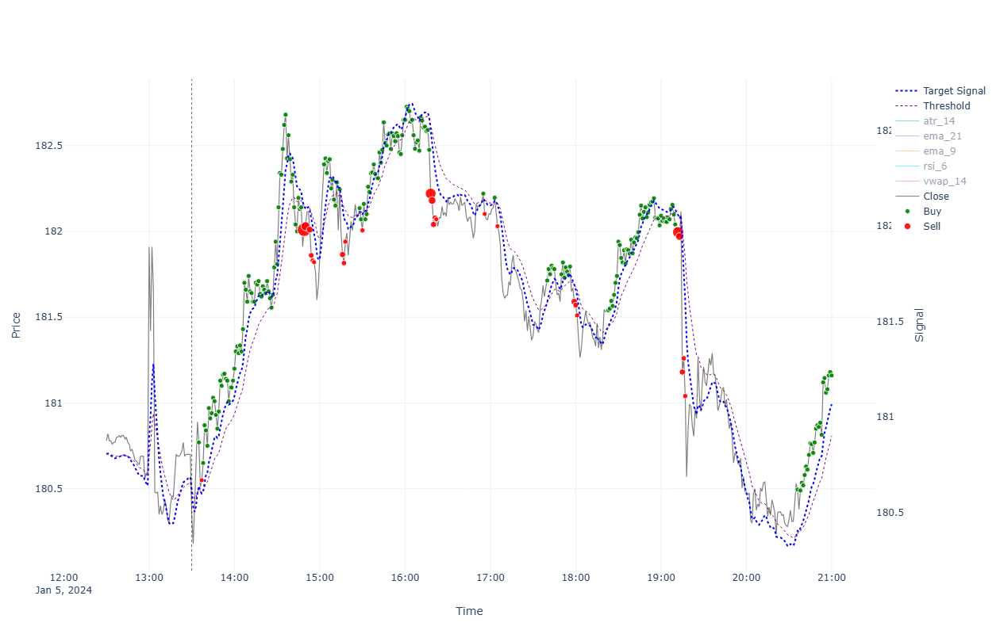


                                                  ******* Performance for 2024-01-05 *******

INTRADAY:
  shares(576); [ask_buy=180.376, fee_buy=0.004, pos_amnt_buy=103898.919]; [bid_sell=181.124, fee_sell=0.018, pos_amnt_sell=104316.832]; leftover=48.529; PNL=417.913
TRADES:
  Tr[1]: Time(13:35)Ask(180.806)Bid(180.734)Act(Buy)Shrs(1)Pos(1); CashTr(-180.81)=Cost(-180.806)-Fee(-0.004); P&L(96807.446)=CashTot(96626.712)+PosAmt(180.734)
  Tr[2]: Time(13:37)Ask(180.586)Bid(180.514)Act(Sell)Shrs(1)Pos(0); CashTr(180.496)=Cost(180.514)-Fee(-0.018); P&L(96807.208)=CashTot(96807.208)+PosAmt(0.0)
  Tr[3]: Time(13:38)Ask(180.686)Bid(180.614)Act(Buy)Shrs(1)Pos(1); CashTr(-180.69)=Cost(-180.686)-Fee(-0.004); P&L(96807.132)=CashTot(96626.518)+PosAmt(180.614)
  Tr[4]: Time(13:39)Ask(180.906)Bid(180.834)Act(Buy)Shrs(1)Pos(2); CashTr(-180.91)=Cost(-180.906)-Fee(-0.004); P&L(96807.275)=CashTot(96445.608)+PosAmt(361.668)
  Tr[5]: Time(13:40)Ask(180.876)Bid(180.804)Act(Buy)Shrs(1)Pos(3); CashTr(-180.88)

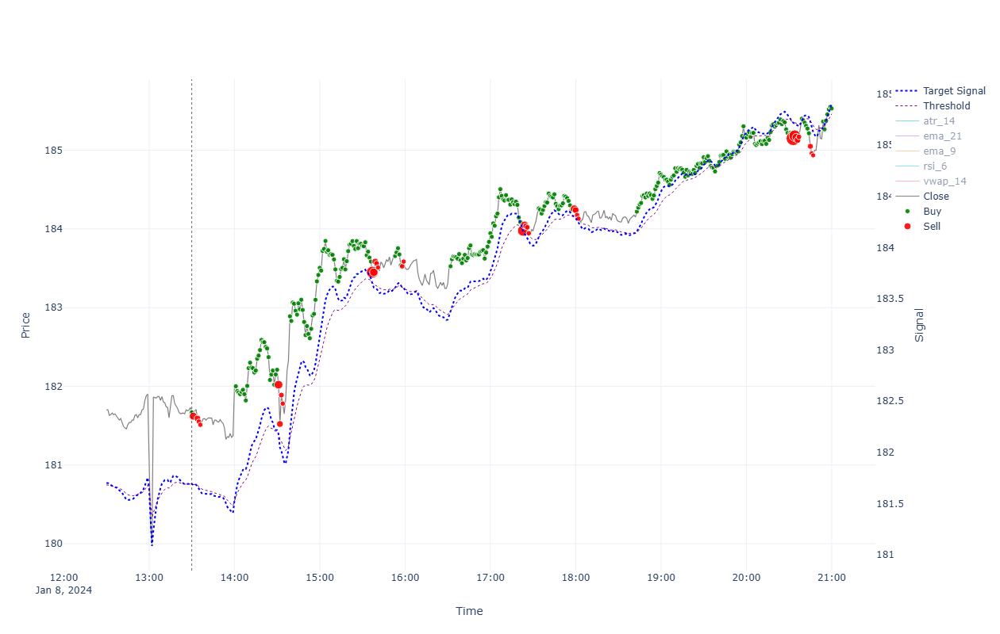


                                                  ******* Performance for 2024-01-08 *******

INTRADAY:
  shares(574); [ask_buy=181.706, fee_buy=0.004, pos_amnt_buy=104301.732]; [bid_sell=185.493, fee_sell=0.018, pos_amnt_sell=106462.442]; leftover=63.629; PNL=2160.71
TRADES:
  Tr[1]: Time(13:30)Ask(181.706)Bid(181.634)Act(Buy)Shrs(1)Pos(25); CashTr(-181.71)=Cost(-181.706)-Fee(-0.004); P&L(96805.664)=CashTot(92264.822)+PosAmt(4540.842)
  Tr[2]: Time(13:31)Ask(181.656)Bid(181.584)Act(Sell)Shrs(13)Pos(12); CashTr(2360.352)=Cost(2360.588)-Fee(-0.236); P&L(96804.178)=CashTot(94625.173)+PosAmt(2179.004)
  Tr[3]: Time(13:34)Ask(181.626)Bid(181.554)Act(Sell)Shrs(7)Pos(5); CashTr(1270.749)=Cost(1270.876)-Fee(-0.127); P&L(96803.691)=CashTot(95895.922)+PosAmt(907.768)
  Tr[4]: Time(13:35)Ask(181.586)Bid(181.514)Act(Sell)Shrs(3)Pos(2); CashTr(544.487)=Cost(544.541)-Fee(-0.054); P&L(96803.436)=CashTot(96440.409)+PosAmt(363.027)
  Tr[5]: Time(13:36)Ask(181.546)Bid(181.474)Act(Sell)Shrs(2)Pos(0); C

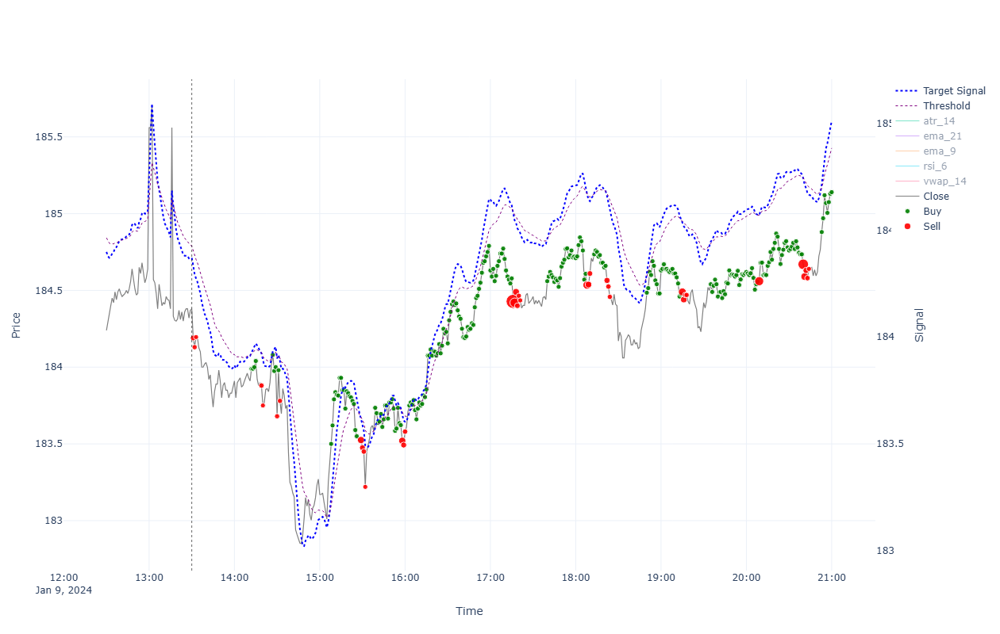


                                                  ******* Performance for 2024-01-09 *******

INTRADAY:
  shares(577); [ask_buy=184.417, fee_buy=0.004, pos_amnt_buy=106410.845]; [bid_sell=185.103, fee_sell=0.018, pos_amnt_sell=106793.886]; leftover=115.225; PNL=383.04
TRADES:
  Tr[1]: Time(13:31)Ask(184.227)Bid(184.153)Act(Sell)Shrs(4)Pos(3); CashTr(736.54)=Cost(736.613)-Fee(-0.073); P&L(96790.191)=CashTot(96237.731)+PosAmt(552.459)
  Tr[2]: Time(13:32)Ask(184.167)Bid(184.093)Act(Sell)Shrs(2)Pos(1); CashTr(368.15)=Cost(368.186)-Fee(-0.036); P&L(96789.974)=CashTot(96605.881)+PosAmt(184.093)
  Tr[3]: Time(13:33)Ask(184.233)Bid(184.159)Act(Sell)Shrs(1)Pos(0); CashTr(184.141)=Cost(184.159)-Fee(-0.018); P&L(96790.022)=CashTot(96790.022)+PosAmt(0.0)
  Tr[4]: Time(14:12)Ask(184.027)Bid(183.953)Act(Buy)Shrs(1)Pos(1); CashTr(-184.031)=Cost(-184.027)-Fee(-0.004); P&L(96789.944)=CashTot(96605.991)+PosAmt(183.953)
  Tr[5]: Time(14:13)Ask(184.027)Bid(183.953)Act(Buy)Shrs(1)Pos(2); CashTr(-184.031)

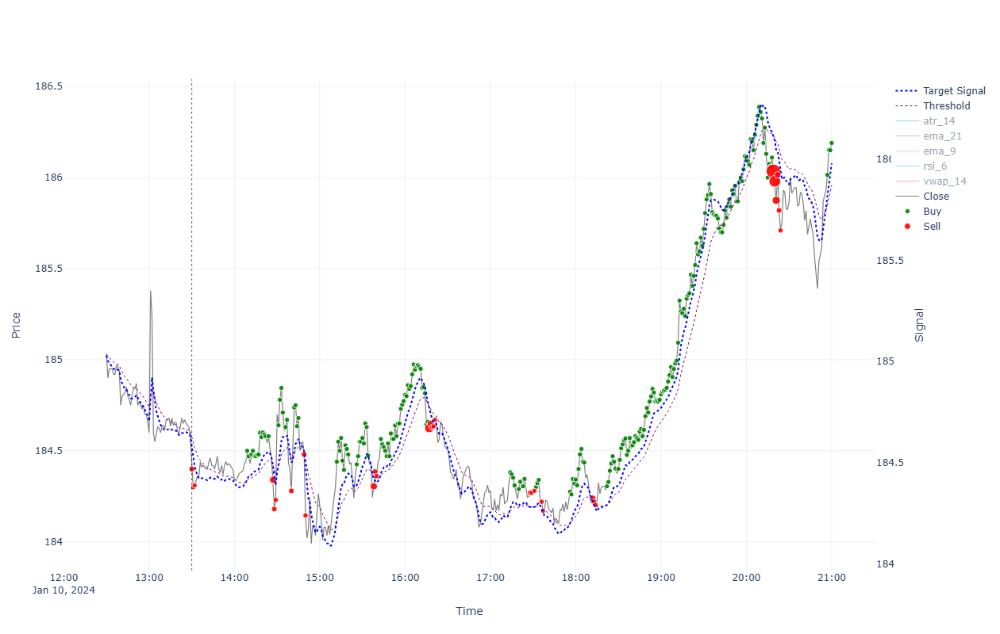


                                                  ******* Performance for 2024-01-10 *******

INTRADAY:
  shares(579); [ask_buy=184.437, fee_buy=0.004, pos_amnt_buy=106791.27]; [bid_sell=186.153, fee_sell=0.018, pos_amnt_sell=107771.87]; leftover=117.842; PNL=980.6
TRADES:
  Tr[1]: Time(13:30)Ask(184.437)Bid(184.363)Act(Sell)Shrs(5)Pos(3); CashTr(921.724)=Cost(921.816)-Fee(-0.091); P&L(96751.698)=CashTot(96198.608)+PosAmt(553.089)
  Tr[2]: Time(13:31)Ask(184.337)Bid(184.263)Act(Sell)Shrs(2)Pos(1); CashTr(368.49)=Cost(368.526)-Fee(-0.036); P&L(96751.361)=CashTot(96567.098)+PosAmt(184.263)
  Tr[3]: Time(13:32)Ask(184.347)Bid(184.273)Act(Sell)Shrs(1)Pos(0); CashTr(184.255)=Cost(184.273)-Fee(-0.018); P&L(96751.353)=CashTot(96751.353)+PosAmt(0.0)
  Tr[4]: Time(14:09)Ask(184.537)Bid(184.463)Act(Buy)Shrs(1)Pos(1); CashTr(-184.541)=Cost(-184.537)-Fee(-0.004); P&L(96751.275)=CashTot(96566.812)+PosAmt(184.463)
  Tr[5]: Time(14:10)Ask(184.507)Bid(184.433)Act(Buy)Shrs(1)Pos(2); CashTr(-184.511)=C

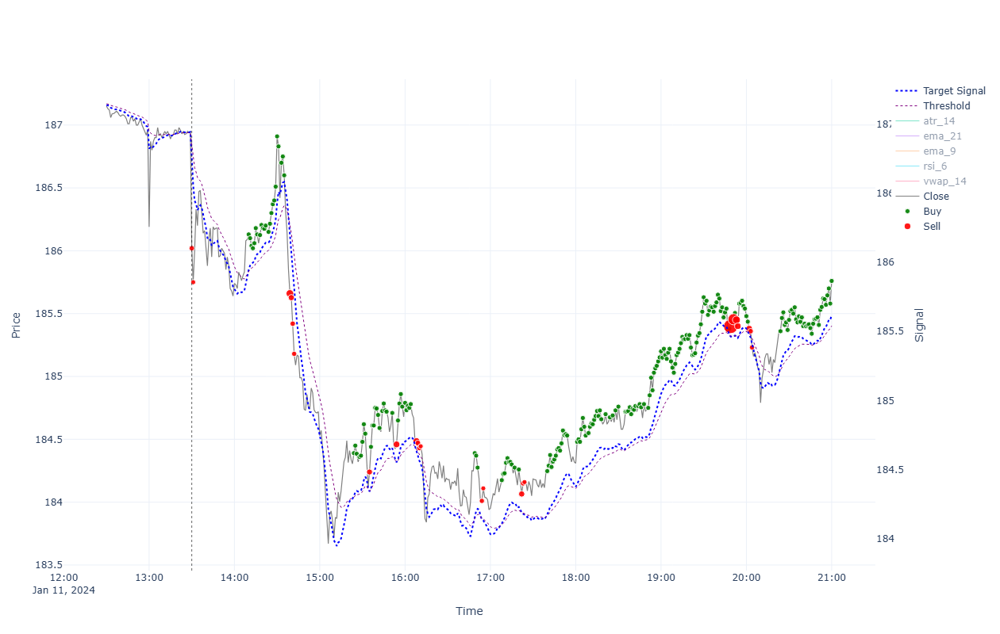


                                                  ******* Performance for 2024-01-11 *******

INTRADAY:
  shares(579); [ask_buy=186.057, fee_buy=0.004, pos_amnt_buy=107729.437]; [bid_sell=185.723, fee_sell=0.018, pos_amnt_sell=107522.955]; leftover=160.274; PNL=-206.482
TRADES:
  Tr[1]: Time(13:30)Ask(186.057)Bid(185.983)Act(Sell)Shrs(3)Pos(1); CashTr(557.894)=Cost(557.948)-Fee(-0.055); P&L(96789.485)=CashTot(96603.502)+PosAmt(185.983)
  Tr[2]: Time(13:31)Ask(185.787)Bid(185.713)Act(Sell)Shrs(1)Pos(0); CashTr(185.695)=Cost(185.713)-Fee(-0.018); P&L(96789.197)=CashTot(96789.197)+PosAmt(0.0)
  Tr[3]: Time(14:10)Ask(186.167)Bid(186.093)Act(Buy)Shrs(1)Pos(1); CashTr(-186.171)=Cost(-186.167)-Fee(-0.004); P&L(96789.118)=CashTot(96603.025)+PosAmt(186.093)
  Tr[4]: Time(14:11)Ask(186.137)Bid(186.063)Act(Buy)Shrs(1)Pos(2); CashTr(-186.141)=Cost(-186.137)-Fee(-0.004); P&L(96789.01)=CashTot(96416.884)+PosAmt(372.126)
  Tr[5]: Time(14:12)Ask(186.077)Bid(186.003)Act(Buy)Shrs(1)Pos(3); CashTr(-186.

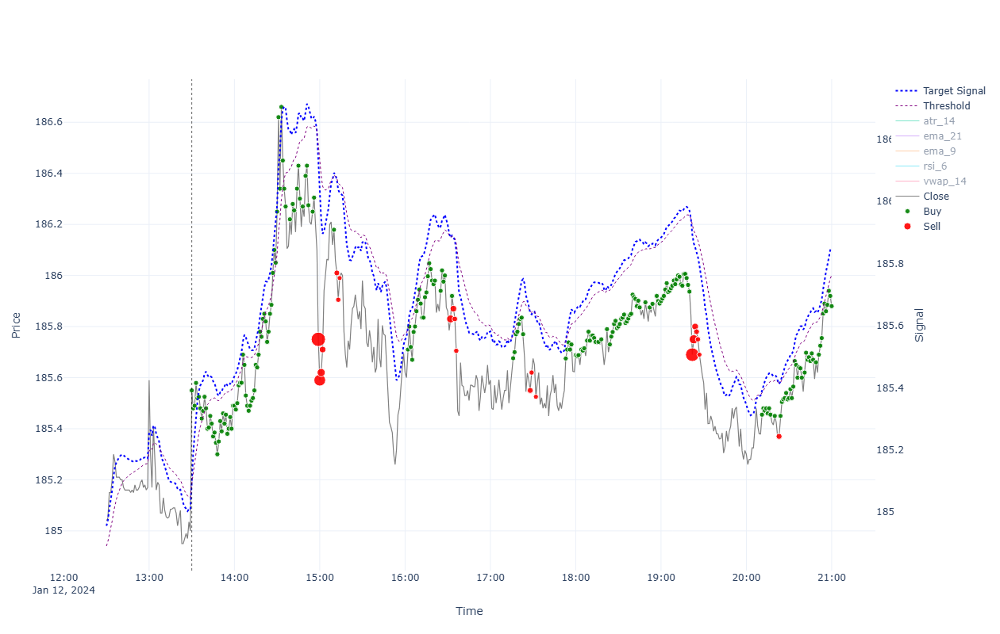


                                                  ******* Performance for 2024-01-12 *******

INTRADAY:
  shares(580); [ask_buy=185.587, fee_buy=0.004, pos_amnt_buy=107642.844]; [bid_sell=185.843, fee_sell=0.018, pos_amnt_sell=107778.244]; leftover=40.386; PNL=135.401
TRADES:
  Tr[1]: Time(13:30)Ask(185.587)Bid(185.513)Act(Buy)Shrs(1)Pos(38); CashTr(-185.591)=Cost(-185.587)-Fee(-0.004); P&L(96791.581)=CashTot(89742.091)+PosAmt(7049.49)
  Tr[2]: Time(13:31)Ask(185.517)Bid(185.443)Act(Buy)Shrs(1)Pos(39); CashTr(-185.521)=Cost(-185.517)-Fee(-0.004); P&L(96788.843)=CashTot(89556.57)+PosAmt(7232.273)
  Tr[3]: Time(13:32)Ask(185.527)Bid(185.453)Act(Buy)Shrs(1)Pos(40); CashTr(-185.531)=Cost(-185.527)-Fee(-0.004); P&L(96789.155)=CashTot(89371.039)+PosAmt(7418.116)
  Tr[4]: Time(13:33)Ask(185.616)Bid(185.542)Act(Buy)Shrs(1)Pos(41); CashTr(-185.62)=Cost(-185.616)-Fee(-0.004); P&L(96792.648)=CashTot(89185.418)+PosAmt(7607.23)
  Tr[5]: Time(13:34)Ask(185.557)Bid(185.483)Act(Buy)Shrs(1)Pos(42); Ca

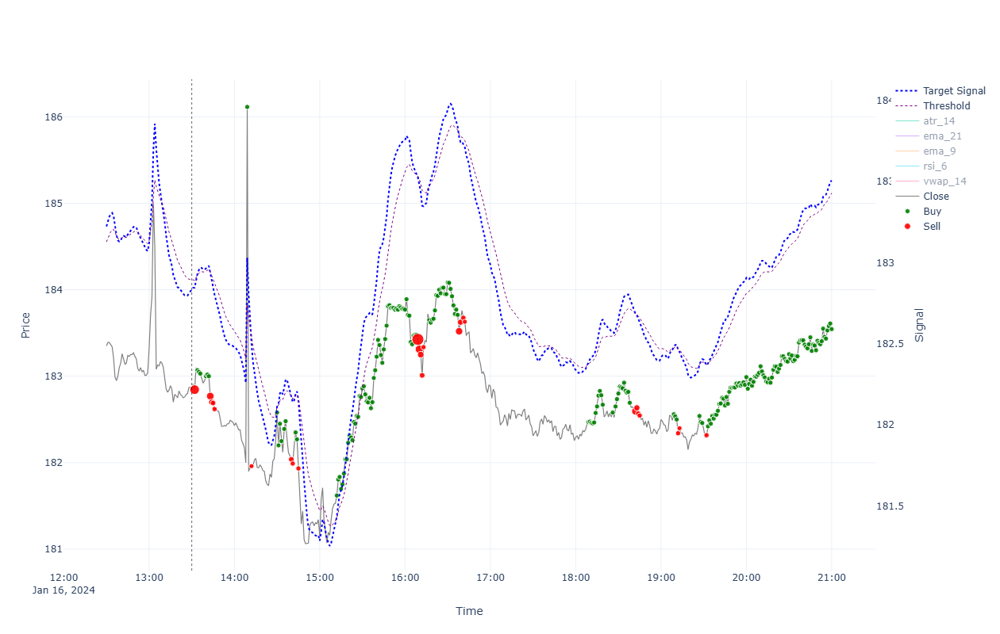


                                                  ******* Performance for 2024-01-16 *******

INTRADAY:
  shares(589); [ask_buy=182.897, fee_buy=0.004, pos_amnt_buy=107728.437]; [bid_sell=183.508, fee_sell=0.018, pos_amnt_sell=108075.657]; leftover=90.193; PNL=347.22
TRADES:
  Tr[1]: Time(13:32)Ask(182.882)Bid(182.808)Act(Sell)Shrs(20)Pos(17); CashTr(3655.805)=Cost(3656.169)-Fee(-0.364); P&L(96655.006)=CashTot(93547.263)+PosAmt(3107.743)
  Tr[2]: Time(13:34)Ask(183.107)Bid(183.033)Act(Buy)Shrs(1)Pos(18); CashTr(-183.111)=Cost(-183.107)-Fee(-0.004); P&L(96658.753)=CashTot(93364.152)+PosAmt(3294.601)
  Tr[3]: Time(13:35)Ask(183.087)Bid(183.013)Act(Buy)Shrs(1)Pos(19); CashTr(-183.091)=Cost(-183.087)-Fee(-0.004); P&L(96658.316)=CashTot(93181.062)+PosAmt(3477.254)
  Tr[4]: Time(13:36)Ask(183.067)Bid(182.993)Act(Buy)Shrs(1)Pos(20); CashTr(-183.071)=Cost(-183.067)-Fee(-0.004); P&L(96657.859)=CashTot(92997.991)+PosAmt(3659.868)
  Tr[5]: Time(13:40)Ask(183.037)Bid(182.963)Act(Buy)Shrs(1)Pos(21

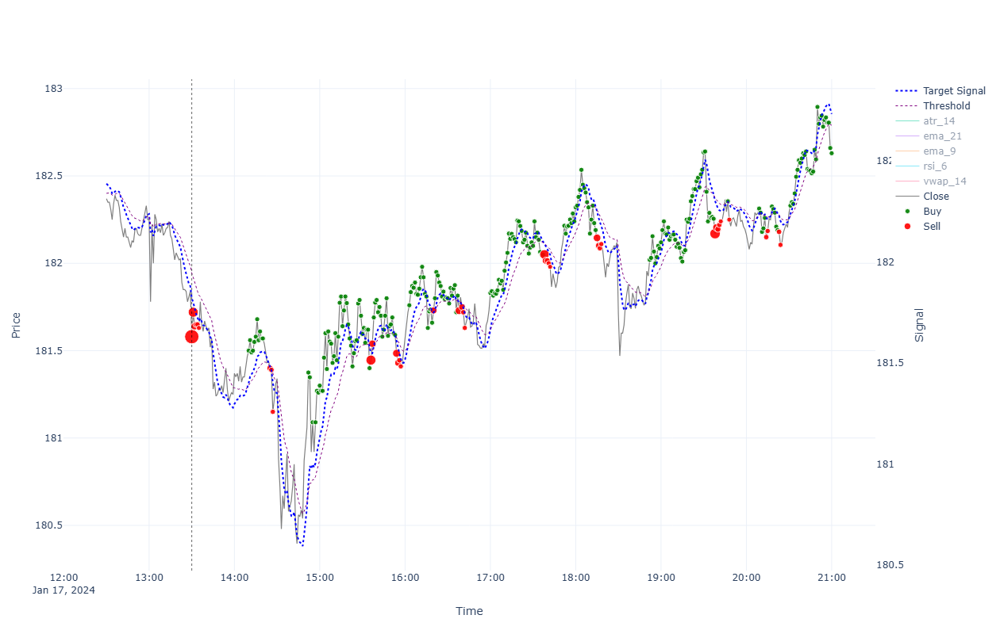


                                                  ******* Performance for 2024-01-17 *******

INTRADAY:
  shares(595); [ask_buy=181.616, fee_buy=0.004, pos_amnt_buy=108064.088]; [bid_sell=182.593, fee_sell=0.018, pos_amnt_sell=108632.294]; leftover=101.762; PNL=568.206
TRADES:
  Tr[1]: Time(13:30)Ask(181.616)Bid(181.544)Act(Sell)Shrs(47)Pos(42); CashTr(8531.699)=Cost(8532.553)-Fee(-0.854); P&L(96502.753)=CashTot(88877.919)+PosAmt(7624.835)
  Tr[2]: Time(13:31)Ask(181.756)Bid(181.684)Act(Sell)Shrs(22)Pos(20); CashTr(3996.641)=Cost(3997.04)-Fee(-0.4); P&L(96508.233)=CashTot(92874.559)+PosAmt(3633.673)
  Tr[3]: Time(13:32)Ask(181.676)Bid(181.604)Act(Sell)Shrs(11)Pos(9); CashTr(1997.441)=Cost(1997.64)-Fee(-0.2); P&L(96506.433)=CashTot(94872.0)+PosAmt(1634.433)
  Tr[4]: Time(13:33)Ask(181.686)Bid(181.614)Act(Sell)Shrs(5)Pos(4); CashTr(907.978)=Cost(908.068)-Fee(-0.091); P&L(96506.432)=CashTot(95779.977)+PosAmt(726.455)
  Tr[5]: Time(13:34)Ask(181.686)Bid(181.614)Act(Sell)Shrs(3)Pos(1); Cas

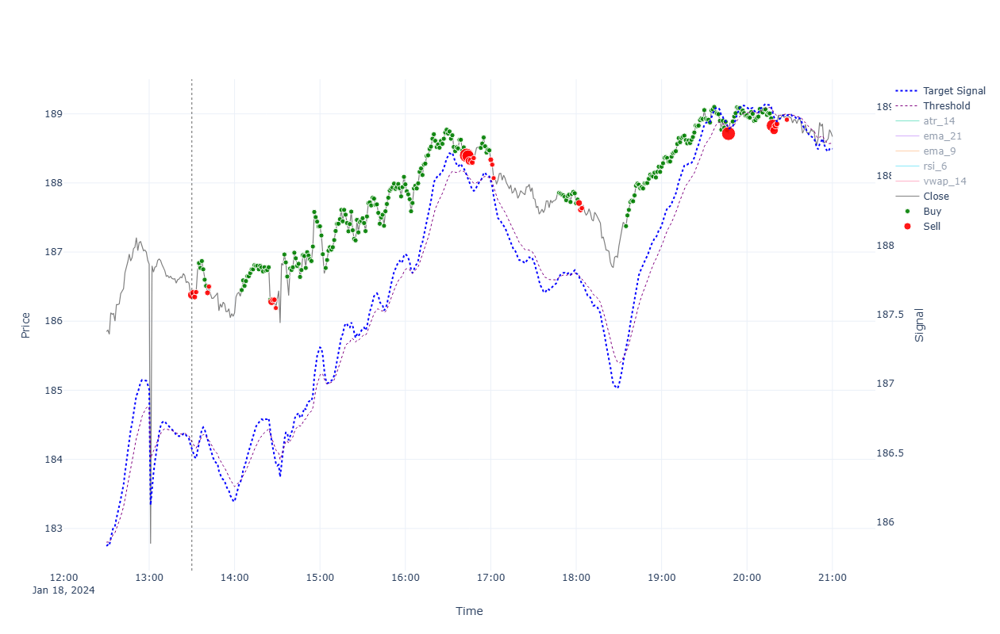


                                                  ******* Performance for 2024-01-18 *******

INTRADAY:
  shares(583); [ask_buy=186.417, fee_buy=0.004, pos_amnt_buy=108683.604]; [bid_sell=188.632, fee_sell=0.018, pos_amnt_sell=109961.925]; leftover=50.452; PNL=1278.322
TRADES:
  Tr[1]: Time(13:30)Ask(186.417)Bid(186.343)Act(Sell)Shrs(16)Pos(14); CashTr(2981.191)=Cost(2981.484)-Fee(-0.292); P&L(96576.141)=CashTot(93967.343)+PosAmt(2608.798)
  Tr[2]: Time(13:31)Ask(186.447)Bid(186.373)Act(Sell)Shrs(8)Pos(6); CashTr(1490.836)=Cost(1490.982)-Fee(-0.146); P&L(96576.415)=CashTot(95458.179)+PosAmt(1118.236)
  Tr[3]: Time(13:32)Ask(186.387)Bid(186.313)Act(Sell)Shrs(4)Pos(2); CashTr(745.178)=Cost(745.251)-Fee(-0.073); P&L(96575.982)=CashTot(96203.356)+PosAmt(372.625)
  Tr[4]: Time(13:33)Ask(186.457)Bid(186.383)Act(Sell)Shrs(2)Pos(0); CashTr(372.729)=Cost(372.765)-Fee(-0.037); P&L(96576.085)=CashTot(96576.085)+PosAmt(0.0)
  Tr[5]: Time(13:35)Ask(186.877)Bid(186.803)Act(Buy)Shrs(1)Pos(1); CashTr

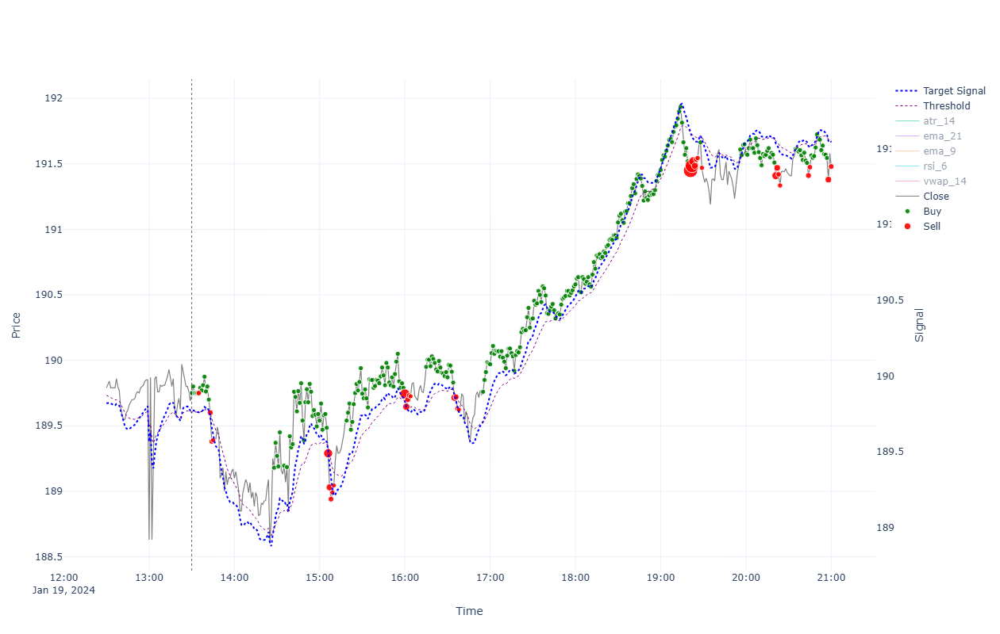


                                                  ******* Performance for 2024-01-19 *******

INTRADAY:
  shares(579); [ask_buy=189.788, fee_buy=0.004, pos_amnt_buy=109889.539]; [bid_sell=191.442, fee_sell=0.018, pos_amnt_sell=110834.097]; leftover=122.838; PNL=944.558
TRADES:
  Tr[1]: Time(13:30)Ask(189.788)Bid(189.712)Act(Buy)Shrs(1)Pos(1); CashTr(-189.792)=Cost(-189.788)-Fee(-0.004); P&L(96639.804)=CashTot(96450.092)+PosAmt(189.712)
  Tr[2]: Time(13:31)Ask(189.838)Bid(189.762)Act(Buy)Shrs(1)Pos(2); CashTr(-189.842)=Cost(-189.838)-Fee(-0.004); P&L(96639.774)=CashTot(96260.25)+PosAmt(379.524)
  Tr[3]: Time(13:32)Ask(189.788)Bid(189.712)Act(Buy)Shrs(1)Pos(3); CashTr(-189.792)=Cost(-189.788)-Fee(-0.004); P&L(96639.594)=CashTot(96070.458)+PosAmt(569.136)
  Tr[4]: Time(13:33)Ask(189.788)Bid(189.712)Act(Buy)Shrs(1)Pos(4); CashTr(-189.792)=Cost(-189.788)-Fee(-0.004); P&L(96639.514)=CashTot(95880.666)+PosAmt(758.848)
  Tr[5]: Time(13:34)Ask(189.788)Bid(189.712)Act(Buy)Shrs(1)Pos(5); CashTr(

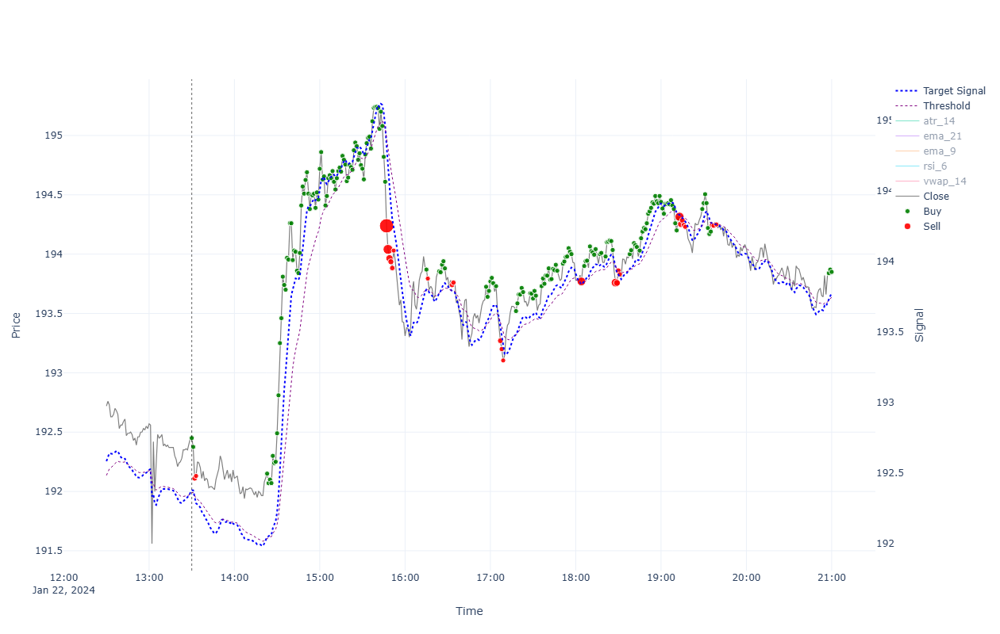


                                                  ******* Performance for 2024-01-22 *******

INTRADAY:
  shares(576); [ask_buy=192.488, fee_buy=0.004, pos_amnt_buy=110875.674]; [bid_sell=193.811, fee_sell=0.018, pos_amnt_sell=111624.643]; leftover=81.261; PNL=748.969
TRADES:
  Tr[1]: Time(13:30)Ask(192.488)Bid(192.412)Act(Buy)Shrs(1)Pos(3); CashTr(-192.492)=Cost(-192.488)-Fee(-0.004); P&L(96684.428)=CashTot(96107.194)+PosAmt(577.235)
  Tr[2]: Time(13:31)Ask(192.413)Bid(192.337)Act(Buy)Shrs(1)Pos(4); CashTr(-192.417)=Cost(-192.413)-Fee(-0.004); P&L(96684.122)=CashTot(95914.776)+PosAmt(769.346)
  Tr[3]: Time(13:32)Ask(192.148)Bid(192.072)Act(Sell)Shrs(3)Pos(1); CashTr(576.16)=Cost(576.215)-Fee(-0.055); P&L(96683.007)=CashTot(96490.936)+PosAmt(192.072)
  Tr[4]: Time(13:33)Ask(192.169)Bid(192.092)Act(Sell)Shrs(1)Pos(0); CashTr(192.074)=Cost(192.092)-Fee(-0.018); P&L(96683.009)=CashTot(96683.009)+PosAmt(0.0)
  Tr[5]: Time(14:23)Ask(192.188)Bid(192.112)Act(Buy)Shrs(1)Pos(1); CashTr(-192.19

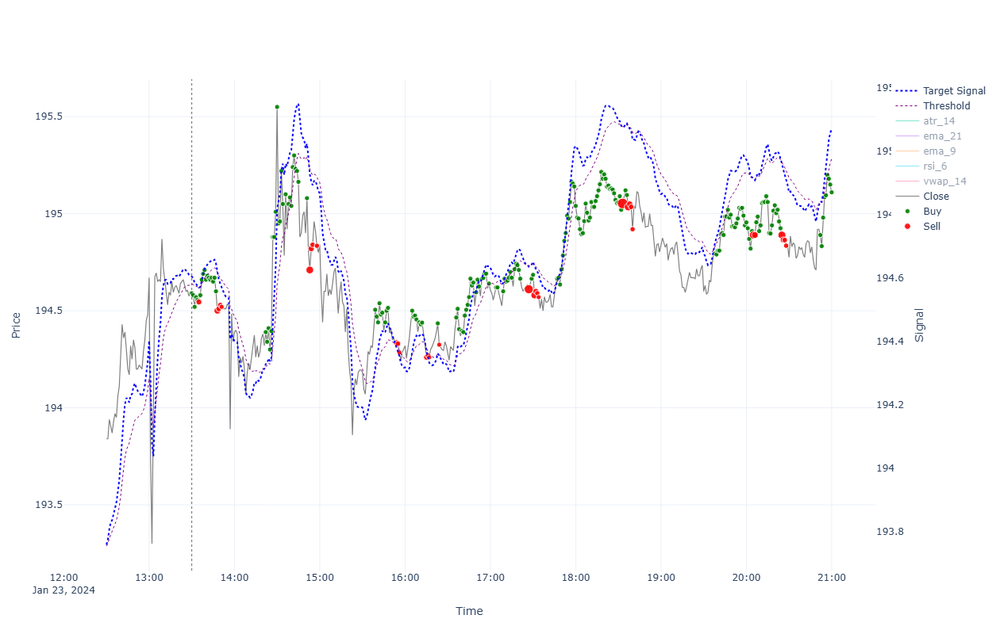


                                                  ******* Performance for 2024-01-23 *******

INTRADAY:
  shares(573); [ask_buy=194.629, fee_buy=0.004, pos_amnt_buy=111524.662]; [bid_sell=195.071, fee_sell=0.018, pos_amnt_sell=111765.084]; leftover=181.242; PNL=240.422
TRADES:
  Tr[1]: Time(13:30)Ask(194.629)Bid(194.551)Act(Buy)Shrs(1)Pos(4); CashTr(-194.633)=Cost(-194.629)-Fee(-0.004); P&L(96639.705)=CashTot(95861.501)+PosAmt(778.204)
  Tr[2]: Time(13:31)Ask(194.619)Bid(194.541)Act(Buy)Shrs(1)Pos(5); CashTr(-194.623)=Cost(-194.619)-Fee(-0.004); P&L(96639.584)=CashTot(95666.878)+PosAmt(972.705)
  Tr[3]: Time(13:32)Ask(194.559)Bid(194.481)Act(Buy)Shrs(1)Pos(6); CashTr(-194.563)=Cost(-194.559)-Fee(-0.004); P&L(96639.202)=CashTot(95472.315)+PosAmt(1166.887)
  Tr[4]: Time(13:33)Ask(194.609)Bid(194.531)Act(Buy)Shrs(1)Pos(7); CashTr(-194.613)=Cost(-194.609)-Fee(-0.004); P&L(96639.42)=CashTot(95277.702)+PosAmt(1361.718)
  Tr[5]: Time(13:34)Ask(194.594)Bid(194.516)Act(Buy)Shrs(1)Pos(8); CashT

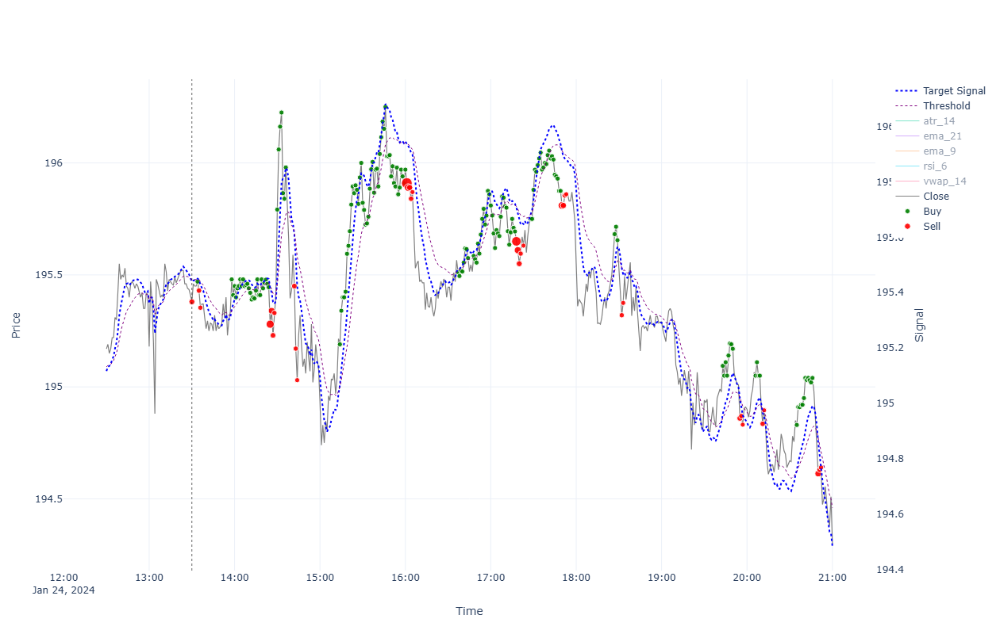


                                                  ******* Performance for 2024-01-24 *******

INTRADAY:
  shares(572); [ask_buy=195.419, fee_buy=0.004, pos_amnt_buy=111781.999]; [bid_sell=194.261, fee_sell=0.018, pos_amnt_sell=111106.814]; leftover=164.326; PNL=-675.185
TRADES:
  Tr[1]: Time(13:30)Ask(195.419)Bid(195.341)Act(Sell)Shrs(5)Pos(4); CashTr(976.612)=Cost(976.705)-Fee(-0.092); P&L(96611.004)=CashTot(95829.64)+PosAmt(781.364)
  Tr[2]: Time(13:34)Ask(195.509)Bid(195.431)Act(Buy)Shrs(1)Pos(5); CashTr(-195.513)=Cost(-195.509)-Fee(-0.004); P&L(96611.282)=CashTot(95634.127)+PosAmt(977.155)
  Tr[3]: Time(13:35)Ask(195.469)Bid(195.391)Act(Sell)Shrs(3)Pos(2); CashTr(586.117)=Cost(586.173)-Fee(-0.055); P&L(96611.026)=CashTot(96220.244)+PosAmt(390.782)
  Tr[4]: Time(13:36)Ask(195.393)Bid(195.315)Act(Sell)Shrs(2)Pos(0); CashTr(390.592)=Cost(390.629)-Fee(-0.037); P&L(96610.836)=CashTot(96610.836)+PosAmt(0.0)
  Tr[5]: Time(13:58)Ask(195.519)Bid(195.441)Act(Buy)Shrs(1)Pos(1); CashTr(-195.5

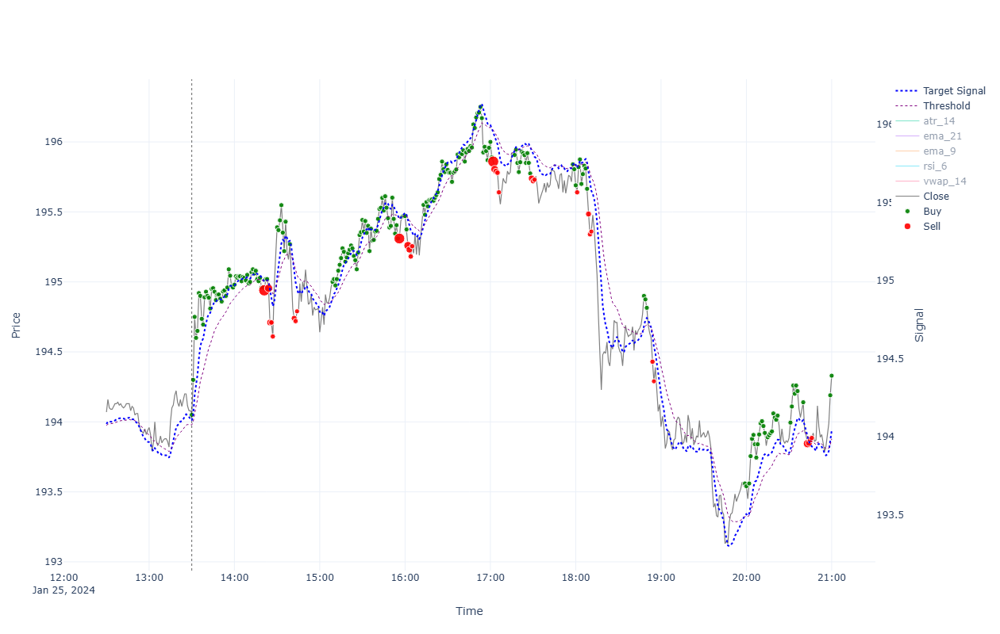


                                                  ******* Performance for 2024-01-25 *******

INTRADAY:
  shares(573); [ask_buy=194.089, fee_buy=0.004, pos_amnt_buy=111215.18]; [bid_sell=194.291, fee_sell=0.018, pos_amnt_sell=111318.243]; leftover=55.96; PNL=103.063
TRADES:
  Tr[1]: Time(13:30)Ask(194.089)Bid(194.011)Act(Buy)Shrs(1)Pos(1); CashTr(-194.093)=Cost(-194.089)-Fee(-0.004); P&L(96573.375)=CashTot(96379.364)+PosAmt(194.011)
  Tr[2]: Time(13:31)Ask(194.339)Bid(194.261)Act(Buy)Shrs(1)Pos(2); CashTr(-194.343)=Cost(-194.339)-Fee(-0.004); P&L(96573.543)=CashTot(96185.021)+PosAmt(388.522)
  Tr[3]: Time(13:32)Ask(194.789)Bid(194.711)Act(Buy)Shrs(1)Pos(3); CashTr(-194.793)=Cost(-194.789)-Fee(-0.004); P&L(96574.361)=CashTot(95990.228)+PosAmt(584.133)
  Tr[4]: Time(13:33)Ask(194.639)Bid(194.561)Act(Buy)Shrs(1)Pos(4); CashTr(-194.643)=Cost(-194.639)-Fee(-0.004); P&L(96573.829)=CashTot(95795.585)+PosAmt(778.244)
  Tr[5]: Time(13:34)Ask(194.689)Bid(194.611)Act(Buy)Shrs(1)Pos(5); CashTr(-1

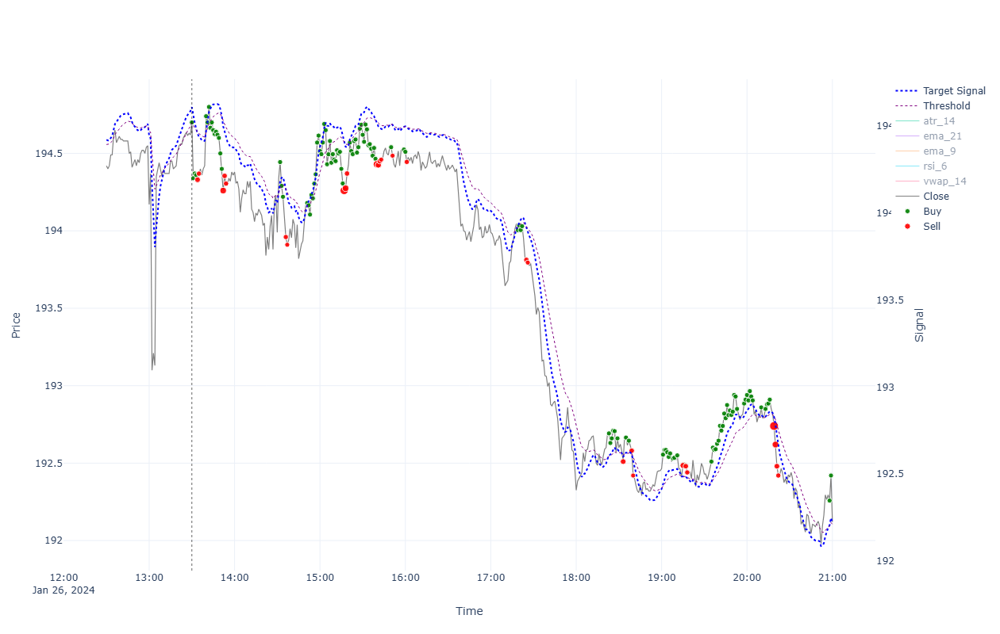


                                                  ******* Performance for 2024-01-26 *******

INTRADAY:
  shares(571); [ask_buy=194.739, fee_buy=0.004, pos_amnt_buy=111198.219]; [bid_sell=192.082, fee_sell=0.018, pos_amnt_sell=109668.069]; leftover=175.985; PNL=-1530.15
TRADES:
  Tr[1]: Time(13:30)Ask(194.739)Bid(194.661)Act(Buy)Shrs(1)Pos(3); CashTr(-194.743)=Cost(-194.739)-Fee(-0.004); P&L(96533.616)=CashTot(95949.633)+PosAmt(583.983)
  Tr[2]: Time(13:31)Ask(194.379)Bid(194.301)Act(Buy)Shrs(1)Pos(4); CashTr(-194.383)=Cost(-194.379)-Fee(-0.004); P&L(96532.454)=CashTot(95755.25)+PosAmt(777.205)
  Tr[3]: Time(13:32)Ask(194.409)Bid(194.331)Act(Buy)Shrs(1)Pos(5); CashTr(-194.413)=Cost(-194.409)-Fee(-0.004); P&L(96532.493)=CashTot(95560.837)+PosAmt(971.656)
  Tr[4]: Time(13:33)Ask(194.399)Bid(194.321)Act(Buy)Shrs(1)Pos(6); CashTr(-194.403)=Cost(-194.399)-Fee(-0.004); P&L(96532.361)=CashTot(95366.434)+PosAmt(1165.927)
  Tr[5]: Time(13:34)Ask(194.369)Bid(194.291)Act(Sell)Shrs(4)Pos(2); Cash

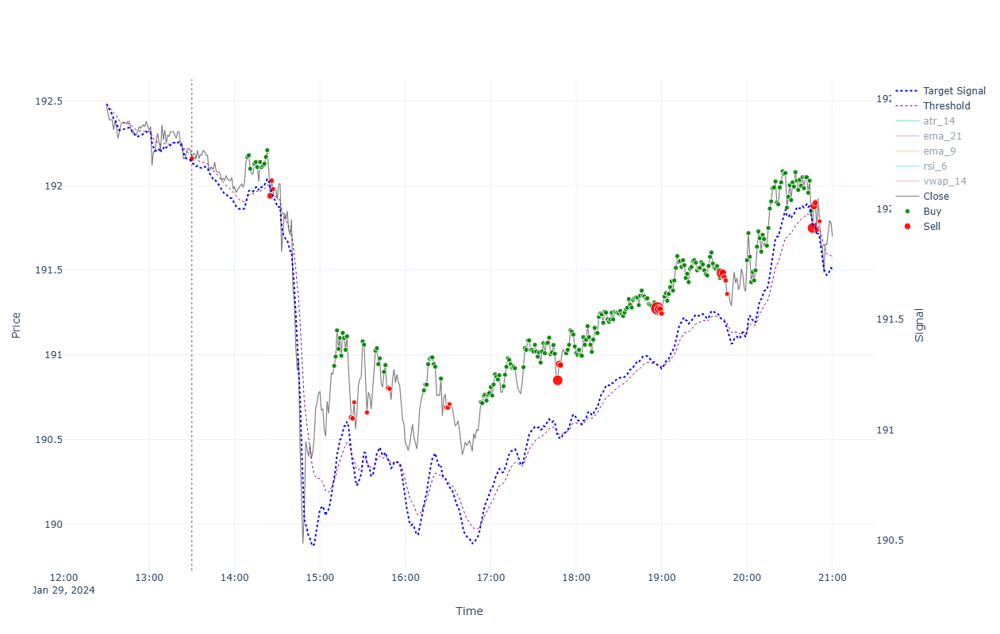


                                                  ******* Performance for 2024-01-29 *******

INTRADAY:
  shares(571); [ask_buy=192.198, fee_buy=0.004, pos_amnt_buy=109747.589]; [bid_sell=191.662, fee_sell=0.018, pos_amnt_sell=109428.303]; leftover=96.465; PNL=-319.286
TRADES:
  Tr[1]: Time(13:30)Ask(192.198)Bid(192.122)Act(Sell)Shrs(2)Pos(0); CashTr(384.206)=Cost(384.243)-Fee(-0.037); P&L(96500.706)=CashTot(96500.706)+PosAmt(0.0)
  Tr[2]: Time(14:09)Ask(192.208)Bid(192.132)Act(Buy)Shrs(1)Pos(1); CashTr(-192.212)=Cost(-192.208)-Fee(-0.004); P&L(96500.625)=CashTot(96308.494)+PosAmt(192.132)
  Tr[3]: Time(14:10)Ask(192.218)Bid(192.142)Act(Buy)Shrs(1)Pos(2); CashTr(-192.222)=Cost(-192.218)-Fee(-0.004); P&L(96500.555)=CashTot(96116.271)+PosAmt(384.283)
  Tr[4]: Time(14:11)Ask(192.138)Bid(192.062)Act(Buy)Shrs(1)Pos(3); CashTr(-192.142)=Cost(-192.138)-Fee(-0.004); P&L(96500.314)=CashTot(95924.129)+PosAmt(576.185)
  Tr[5]: Time(14:14)Ask(192.168)Bid(192.092)Act(Buy)Shrs(1)Pos(4); CashTr(-192

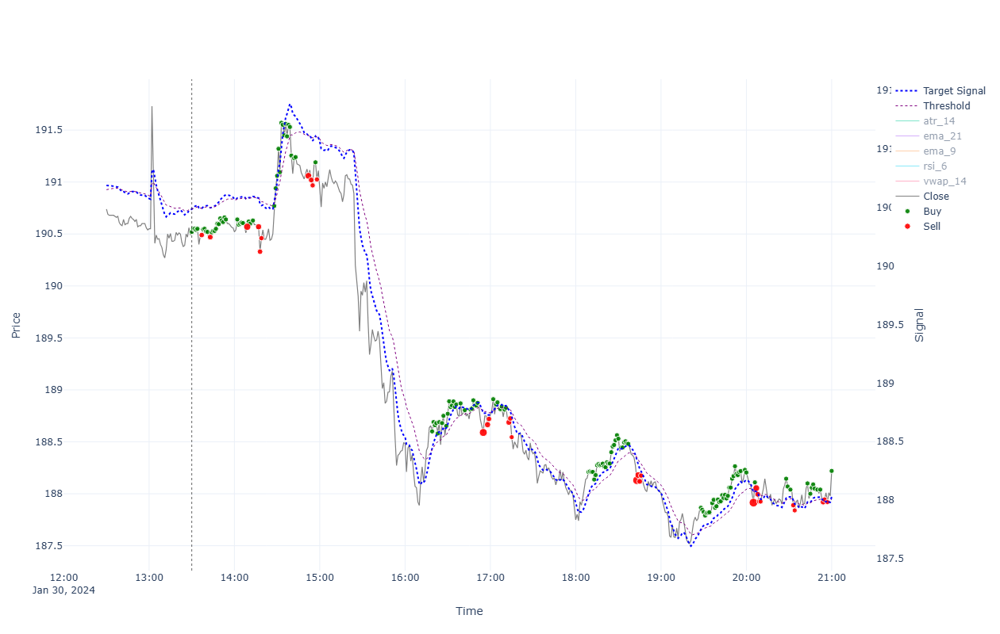


                                                  ******* Performance for 2024-01-30 *******

INTRADAY:
  shares(574); [ask_buy=190.558, fee_buy=0.004, pos_amnt_buy=109382.648]; [bid_sell=188.182, fee_sell=0.018, pos_amnt_sell=108006.158]; leftover=142.12; PNL=-1376.49
TRADES:
  Tr[1]: Time(13:30)Ask(190.558)Bid(190.482)Act(Buy)Shrs(1)Pos(1); CashTr(-190.562)=Cost(-190.558)-Fee(-0.004); P&L(96468.024)=CashTot(96277.542)+PosAmt(190.482)
  Tr[2]: Time(13:31)Ask(190.588)Bid(190.512)Act(Buy)Shrs(1)Pos(2); CashTr(-190.592)=Cost(-190.588)-Fee(-0.004); P&L(96467.973)=CashTot(96086.95)+PosAmt(381.024)
  Tr[3]: Time(13:32)Ask(190.588)Bid(190.512)Act(Buy)Shrs(1)Pos(3); CashTr(-190.592)=Cost(-190.588)-Fee(-0.004); P&L(96467.893)=CashTot(95896.357)+PosAmt(571.536)
  Tr[4]: Time(13:33)Ask(190.578)Bid(190.502)Act(Buy)Shrs(1)Pos(4); CashTr(-190.582)=Cost(-190.578)-Fee(-0.004); P&L(96467.783)=CashTot(95705.775)+PosAmt(762.008)
  Tr[5]: Time(13:34)Ask(190.588)Bid(190.512)Act(Buy)Shrs(1)Pos(5); CashTr(

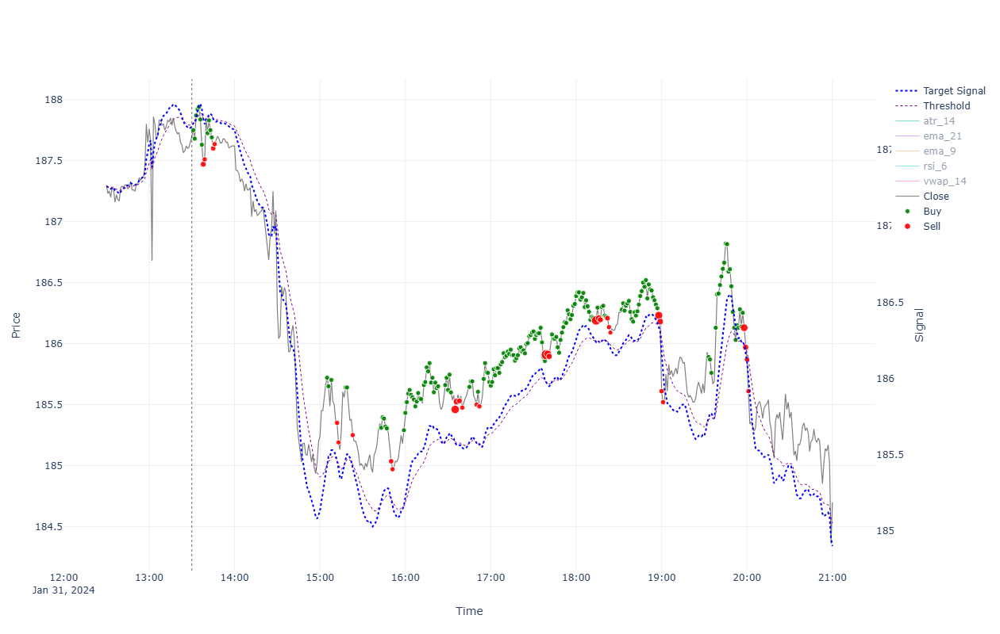


                                                  ******* Performance for 2024-01-31 *******

INTRADAY:
  shares(576); [ask_buy=187.738, fee_buy=0.004, pos_amnt_buy=108139.127]; [bid_sell=184.663, fee_sell=0.018, pos_amnt_sell=106355.418]; leftover=9.151; PNL=-1783.709
TRADES:
  Tr[1]: Time(13:31)Ask(187.788)Bid(187.712)Act(Buy)Shrs(1)Pos(2); CashTr(-187.792)=Cost(-187.788)-Fee(-0.004); P&L(96434.125)=CashTot(96058.7)+PosAmt(375.425)
  Tr[2]: Time(13:32)Ask(187.718)Bid(187.642)Act(Buy)Shrs(1)Pos(3); CashTr(-187.722)=Cost(-187.718)-Fee(-0.004); P&L(96433.906)=CashTot(95870.978)+PosAmt(562.927)
  Tr[3]: Time(13:33)Ask(187.908)Bid(187.832)Act(Buy)Shrs(1)Pos(4); CashTr(-187.912)=Cost(-187.908)-Fee(-0.004); P&L(96434.396)=CashTot(95683.067)+PosAmt(751.33)
  Tr[4]: Time(13:34)Ask(187.958)Bid(187.882)Act(Buy)Shrs(1)Pos(5); CashTr(-187.962)=Cost(-187.958)-Fee(-0.004); P&L(96434.517)=CashTot(95495.105)+PosAmt(939.412)
  Tr[5]: Time(13:35)Ask(187.978)Bid(187.902)Act(Buy)Shrs(1)Pos(6); CashTr(-1

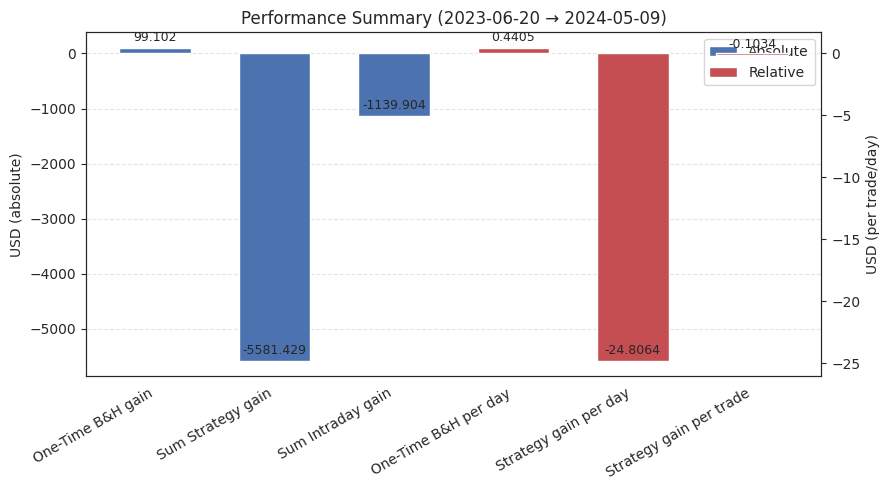

Rolling monthly summary (each metric carries its own capital forward):

Monthly Summary 2023-06 (2023-06-20 = 184.268 → 2023-06-30 = 193.911)
Num. trading days: 9  Trades Count: 2551
One-Time B&H gain: 5214.439 | start: 100000.000 | final: 105214.439 | PnL%: 5.21%
Sum Strategy gain: -198.027 | start: 100000.000 | final: 99801.973 | PnL%: -0.20%
Sum Intraday gain: 4266.253 | start: 100000.000 | final: 104266.253 | PnL%: 4.27%

Monthly Summary 2023-07 (2023-07-03 = 193.911 → 2023-07-31 = 196.311)
Num. trading days: 20  Trades Count: 4602
One-Time B&H gain: 1300.510 | start: 105214.439 | final: 106514.949 | PnL%: 1.24%
Sum Strategy gain: -413.128 | start: 99801.973 | final: 99388.845 | PnL%: -0.41%
Sum Intraday gain: -2552.464 | start: 104266.253 | final: 101713.789 | PnL%: -2.45%

Monthly Summary 2023-08 (2023-08-01 = 196.311 → 2023-08-31 = 188.002)
Num. trading days: 23  Trades Count: 5389
One-Time B&H gain: -4503.015 | start: 106514.949 | final: 102011.934 | PnL%: -4.23%
Sum Strategy g

In [5]:
# importlib.reload(params) ######
# importlib.reload(strategies) ######

year, month = map(int, params.month_to_check.split("-"))
dates_in_month = [date for date in sim_results if date.year == year and date.month == month]

if not dates_in_month:
    print(f"No simulation data for {params.month_to_check}")
else:
    for date in sorted(dates_in_month):
        df_at_date_plot, trades_at_date, stats_at_date = sim_results[date]
        plots.plot_trades(
            df                 = df_at_date_plot,
            col_signal1        = col_signal,
            sign_thresh        = sign_thresh, 
            axis_sig_thresh    = 'second',
            trades             = trades_at_date,
            performance_stats  = stats_at_date,
            features           = ['ema_9','ema_21','rsi_6', 'atr_14', 'vwap_14', 'rsi_thresh'],
            start_plot         = params.sess_start_shift,
            autoscale          = False
        )
        
        print(f"\n{' ' * 50}******* Performance for {date.strftime('%Y-%m-%d')} *******\n")
        for k,v in stats_at_date.items(): # Print stats dict for each date nicely
            print(f"{k}:\n" + "\n".join("  "+L for L in (v if isinstance(v,list) else str(v).splitlines())))
        print("\n" + "-"*150 + "\n")

# final visualizations and monthly aggregations
strategies.aggregate_performance(df = df_inds_test,
                                 sim_results = sim_results,
                                 sess_start = sess_start)
